In [1]:
import pandas as pd
import numpy as np
import pickle
import datetime
import os
import datetime
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import matplotlib.image as mpimg
import math
import time
import sys
from sklearn.metrics import r2_score
import rasterio 

#sys.path.append('./Functions/')
#sys.path.append('/home/r62/r62_directory/Modeling_AGB_with_S2_bands/Functions/')
#from STANDARD_FUNCTIONS import read_pickle, write_pickle
#from DATA_ANALYSIS_FUNCTIONS import standardize_df, remove_outliers

def select_by_R2(obs_RH_values, compared_values):
    l = []
    for neighbor_rh in compared_values:
        l.append(r2_score(obs_RH_values, neighbor_rh))
    l = np.array(l)
    return np.argmax(l)

country = 'costa_rica'
destination = '/mnt/locutus/remotesensing/r62/{country_lower}/FINAL_GEDI_COSTA_RICA.pkl'.format(country_lower = country)

# for making heat mapts
# # https://blog.jovian.ai/interesting-heatmaps-using-python-folium-ee41b118a996

In [2]:
df = pd.read_pickle(destination)
df['Sqrt_AGB'] = np.sqrt(df.AGB)
days_between = df.Date.max() - df.Date.min()


AVG BAND 1 OF 1 IS 1.389416147816911
STD BAND 1 OF 1 IS 2.6897366187168146
NUMBER OF CLASSES: 10


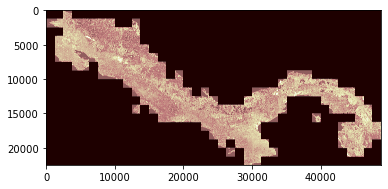

In [3]:
tif_example = rasterio.open('/mnt/locutus/remotesensing/tropics/clustering/costa_rica_panama/k_10/costa_rica_panama_biweekly_smooth.2017-2020.10.mode.tif')

plot = True

tif_example.meta
data = tif_example.read(1)
print('AVG BAND 1 OF', tif_example.count, 'IS', data.mean())
print('STD BAND 1 OF', tif_example.count, 'IS', data.std())

if plot == True:
    plt.imshow(data, cmap='pink')
    
print('NUMBER OF CLASSES:', data.max())

In [4]:
bands_data = pd.DataFrame()
tif_example = rasterio.open('/mnt/locutus/remotesensing/tropics/clustering/costa_rica_panama/k_10/costa_rica_panama_biweekly_smooth.2017-2020.10.mode.tif')
shot_coord_list = np.array([(x,y) for x,y in zip(df['Longitude'] , df['Latitude'])])

bands_data['Cluster'] = [np.nan if (np.isnan(sample[0]) or sample[0] == 0) else sample[0] for sample in tif_example.sample(shot_coord_list.astype('float32'))]
bands_data['Shot_Number'] = np.array(list((map(str, df['Shot_Number']))))

data = df[['Latitude', 'Longitude', 'AGB', 'Time', 'Date', 'RH98', 'RH90', 'RH80', 'RH70', 'RH60', 'RH50', 'RH40', 'RH30', 'RH20', 'Shot_Number']]
data.Shot_Number = data.Shot_Number.astype('int64')
bands_data.Shot_Number = bands_data.Shot_Number.astype('int64')
data = pd.merge(data, bands_data, on='Shot_Number', how='inner')

S2_range = []
for x in range(days_between.days + 1):
    S2_range.append(datetime.timedelta(days=x)+datetime.datetime(2019, 4, 27)) # year month day

interval = (S2_range[-1] - S2_range[0])/(78-1)
print('Each interval is a time span of:', interval)
grouped_cr = data.groupby(pd.Grouper(key='Date', freq=interval))
print('There are', len(grouped_cr.groups), 'groups.')
number_groups = len(grouped_cr.groups)

lis = []
for group, i in enumerate(grouped_cr, start = 1):
    DF = i[1]
    DF['Group'] = group
    lis.append(DF)

data = pd.concat(lis)

# 2019-04-20 is the first day of GEDI data which is the 110th day of 2019
# 110/365 = 0.3 
# 0.3*25 = 7.5 so we start on the 7 1/2th biweek of 2019 so we should start on the 8th biweek

# assuming 25 time periods in 2019 2019/25 = 14.6 days/biweek
# 14.6*8 = 117th day which = April 27 2019

# june 6th 2022 was the 157th day of the year
# 157/365 = 0.4301
# 0.4301*25 = 10.75 so we start on the 10 3/4 biweek of 2022 so we should end on the 11th biweek
# 14.6*11 = 160th day which = June 9 2022

# how many biweeks between them? 
days_between = datetime.datetime(2022, 6, 9) - datetime.datetime(2019, 4, 27)
biweeks = days_between/14.6

print('NUMBER OF DAYS BETWEEN THE TWO DATES:', days_between.days, 'NUMBER OF BIWEEKS BETWEEN THE TWO DATES:', biweeks.days)

print(data.Date.min())
print(data.Date.max())

GROUPS = datetime.datetime(2019, 4, 13) + data.Group*datetime.timedelta(days = 14)
data['Group'] = GROUPS

/home/jbk/anaconda3/envs/remotesensing/lib/python3.9/site-packages/pandas/core/frame.py:3607: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._set_item(key, value)


Each interval is a time span of: 14 days, 11:31:56.883117
There are 78 groups.


/home/jbk/anaconda3/envs/remotesensing/lib/python3.9/site-packages/pandas/core/frame.py:3607: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._set_item(key, value)


NUMBER OF DAYS BETWEEN THE TWO DATES: 1139 NUMBER OF BIWEEKS BETWEEN THE TWO DATES: 78
2019-04-20 11:28:20
2022-05-10 01:50:08


In [6]:
GROUPS

446468    2019-04-27
514199    2019-04-27
575776    2019-04-27
688899    2019-04-27
754635    2019-04-27
             ...    
1359067   2022-04-09
1366173   2022-04-09
1391686   2022-04-09
1415180   2022-04-09
1426643   2022-04-09
Name: Group, Length: 1562805, dtype: datetime64[ns]

# Create RH Profile

/tmp/ipykernel_111758/2789806163.py:45: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xaxis, rotation = 45, fontsize=10)
/tmp/ipykernel_111758/2789806163.py:24: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xaxis, rotation = 45, fontsize=10)
/tmp/ipykernel_111758/2789806163.py:45: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xaxis, rotation = 45, fontsize=10)
/tmp/ipykernel_111758/2789806163.py:45: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xaxis, rotation = 45, fontsize=10)
/tmp/ipykernel_111758/2789806163.py:45: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xaxis, rotation = 45, fontsize=10)
/tmp/ipykernel_111758/2789806163.py:45: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xaxis, ro

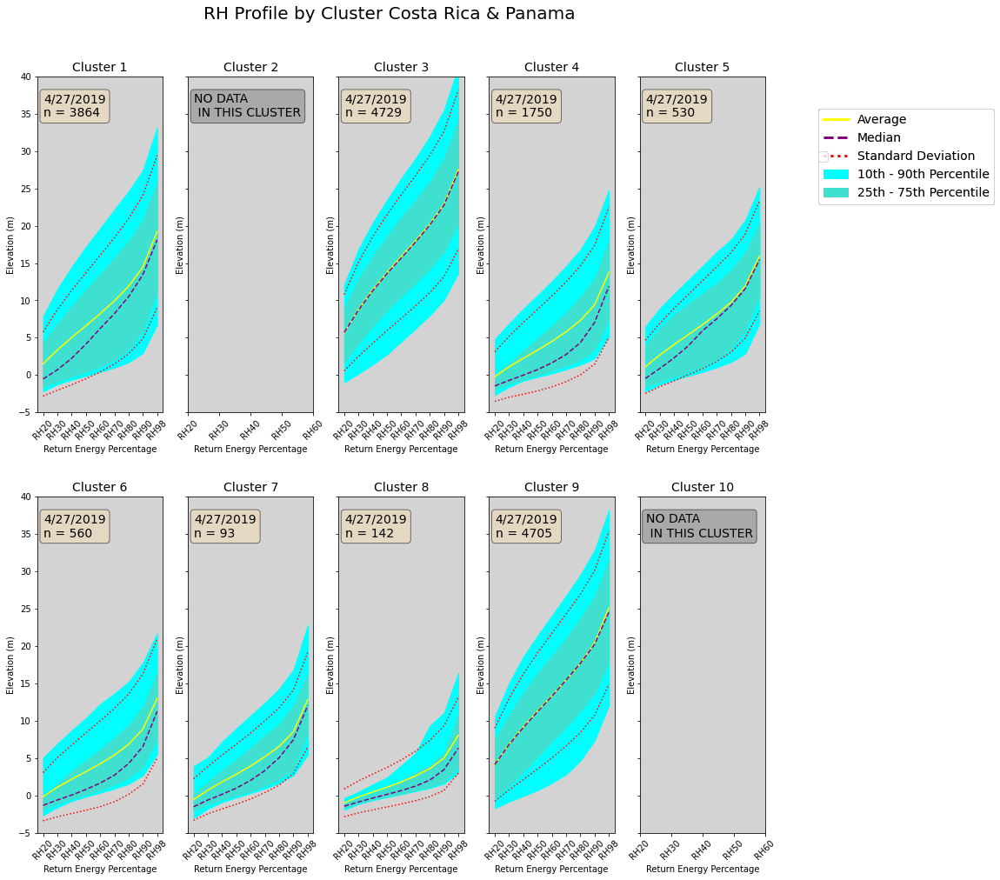

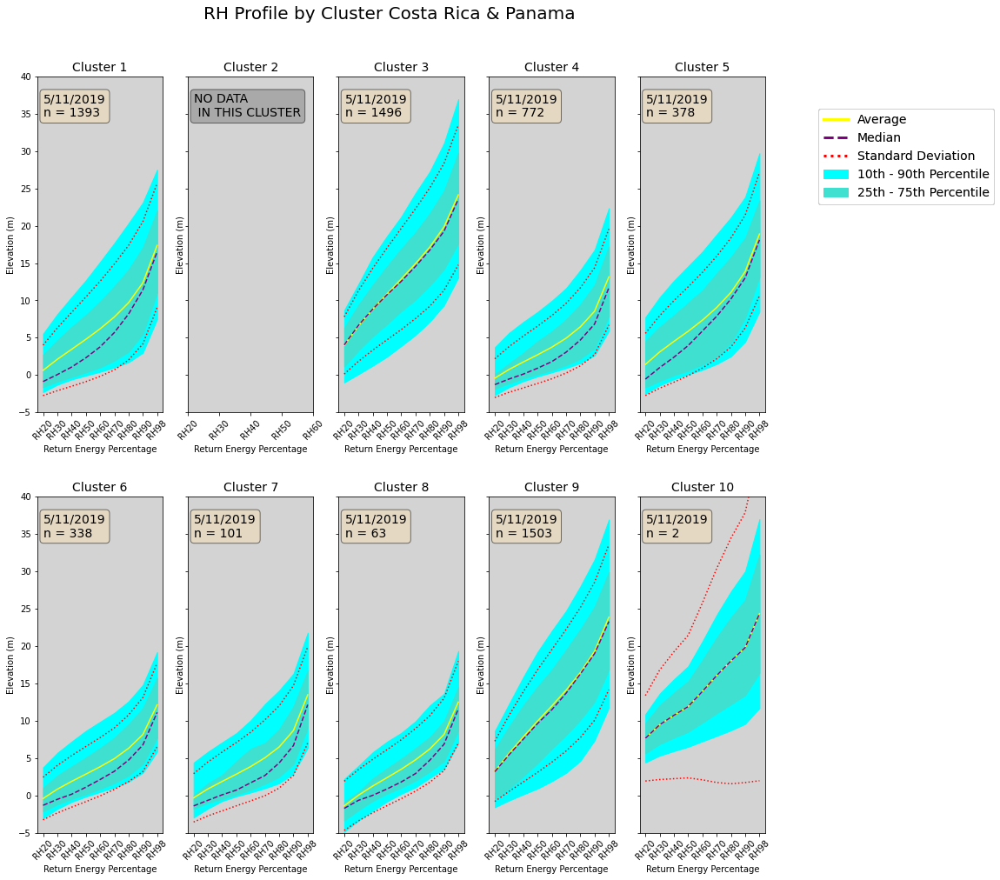

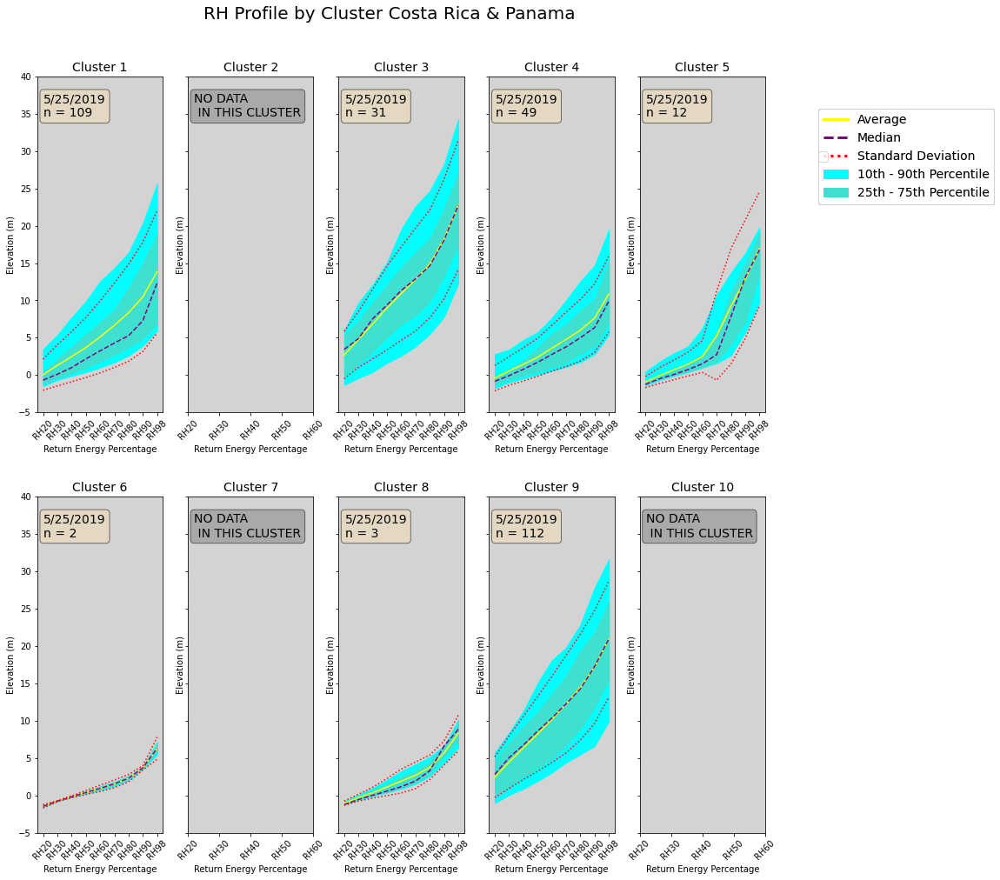

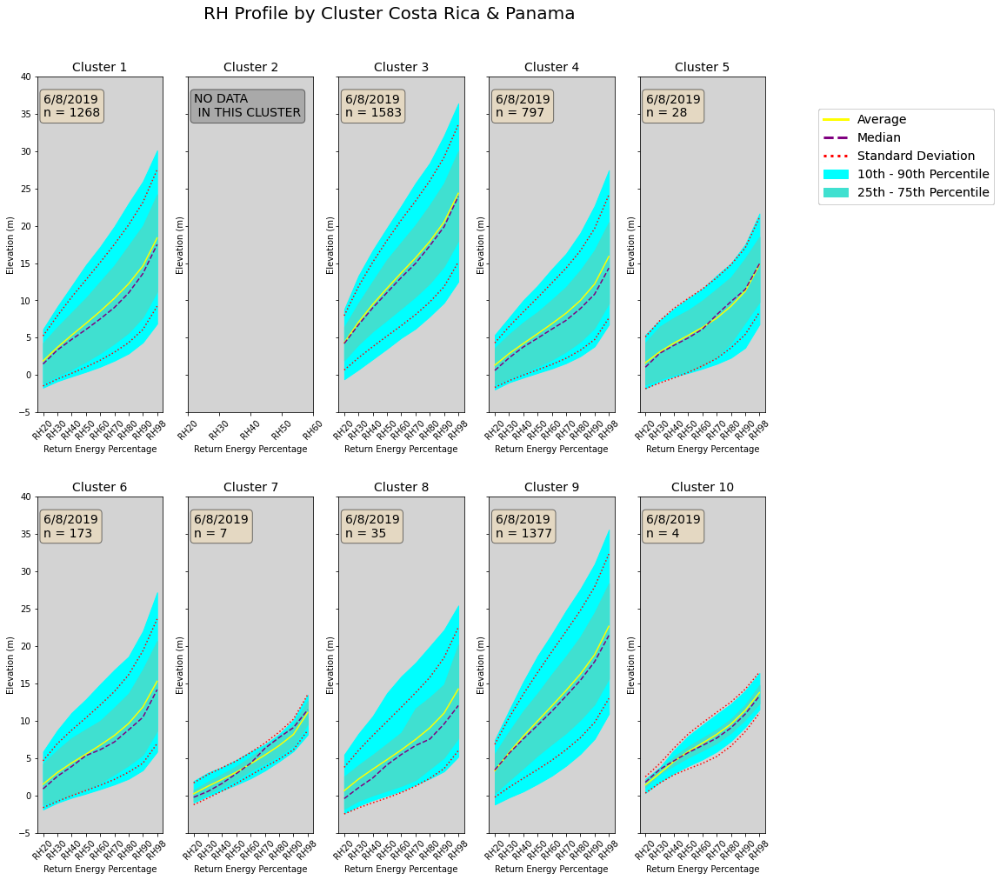

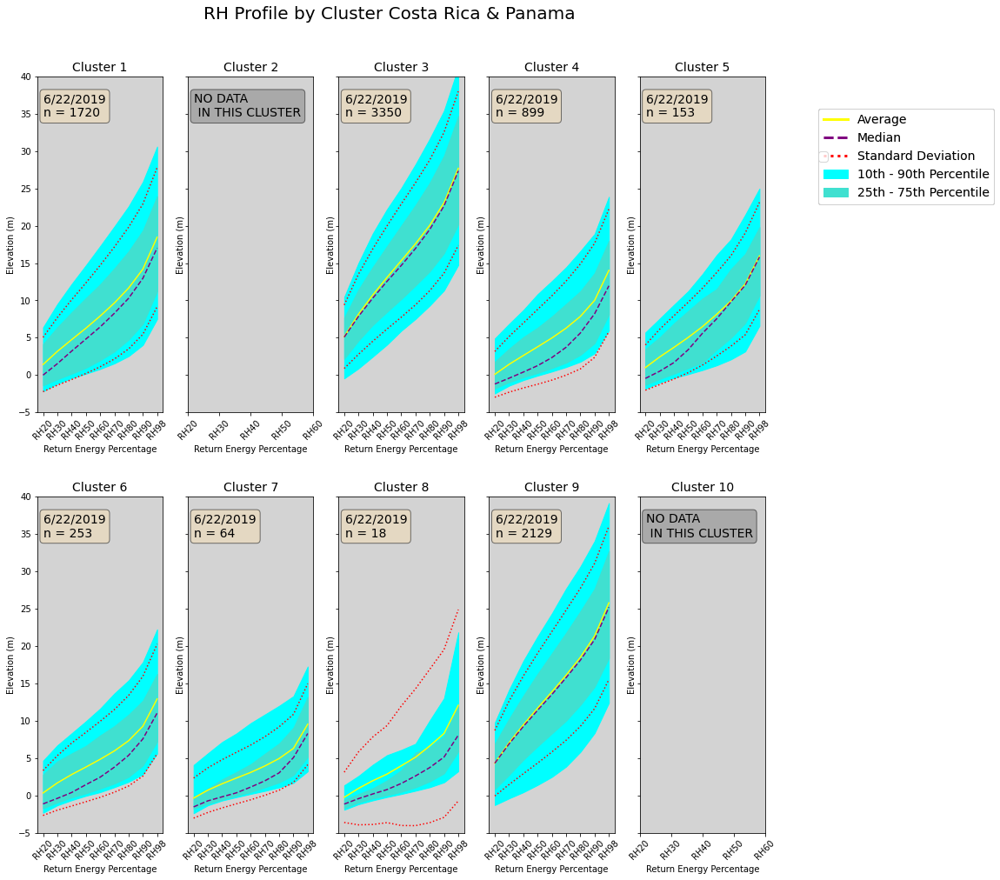

...

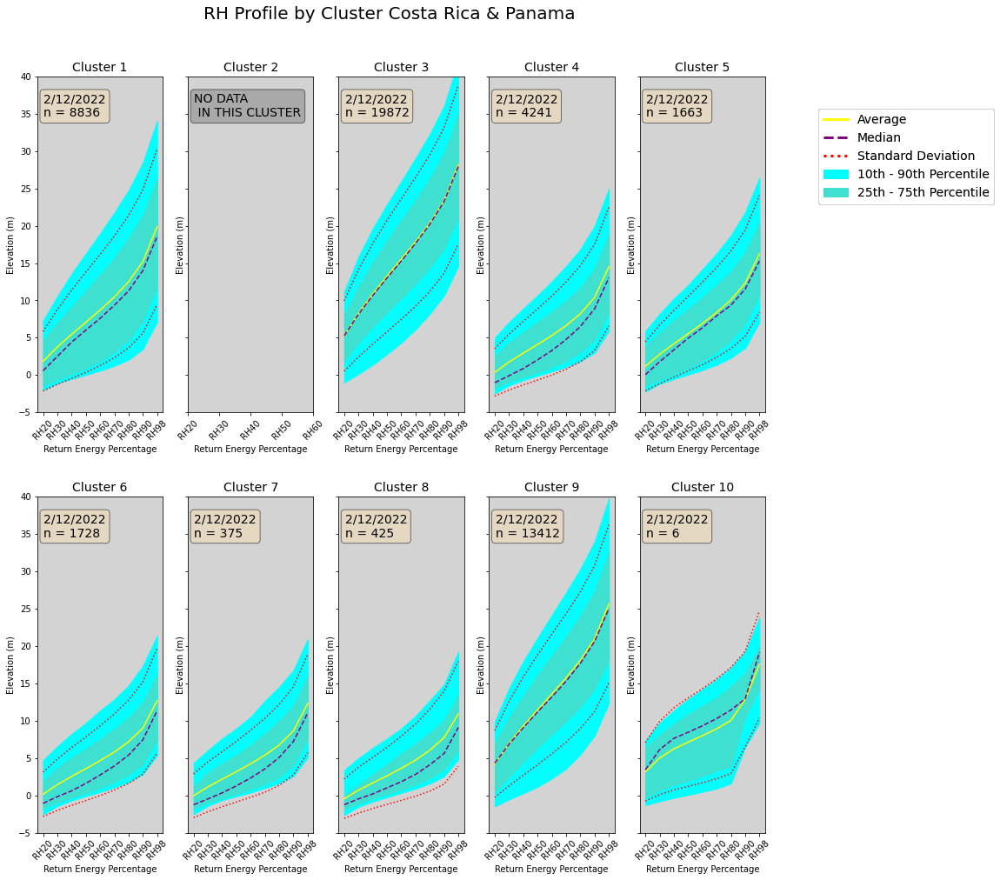

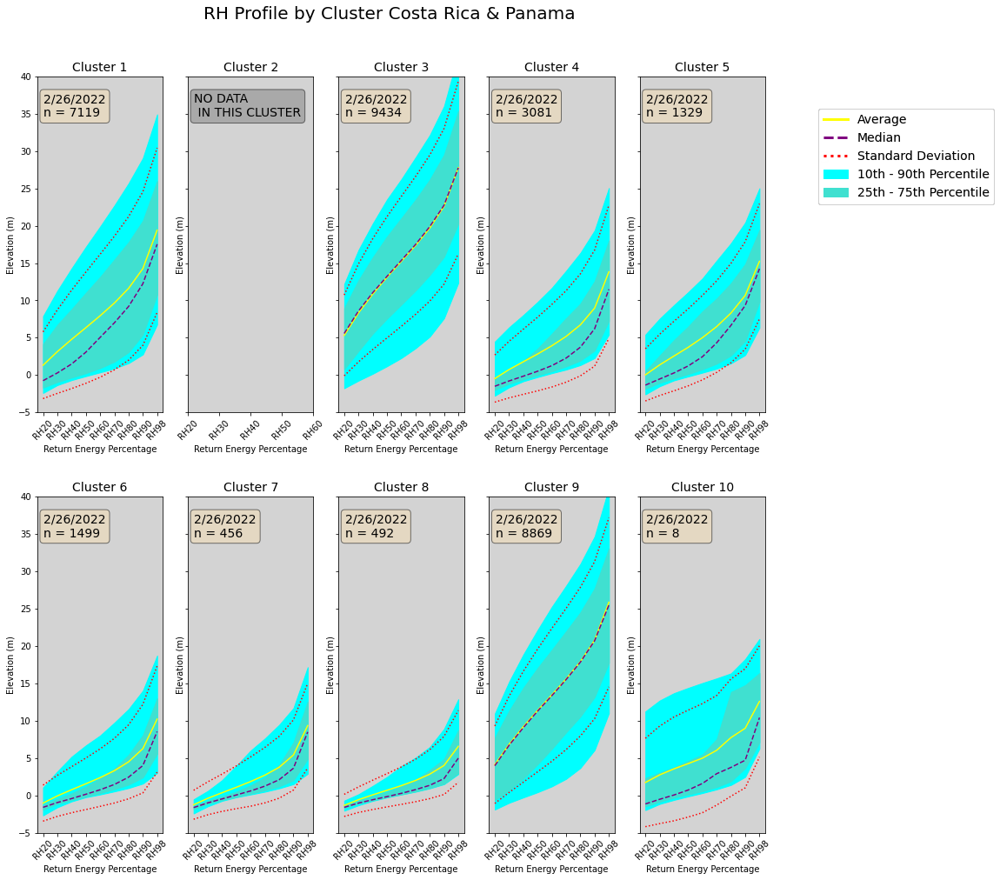

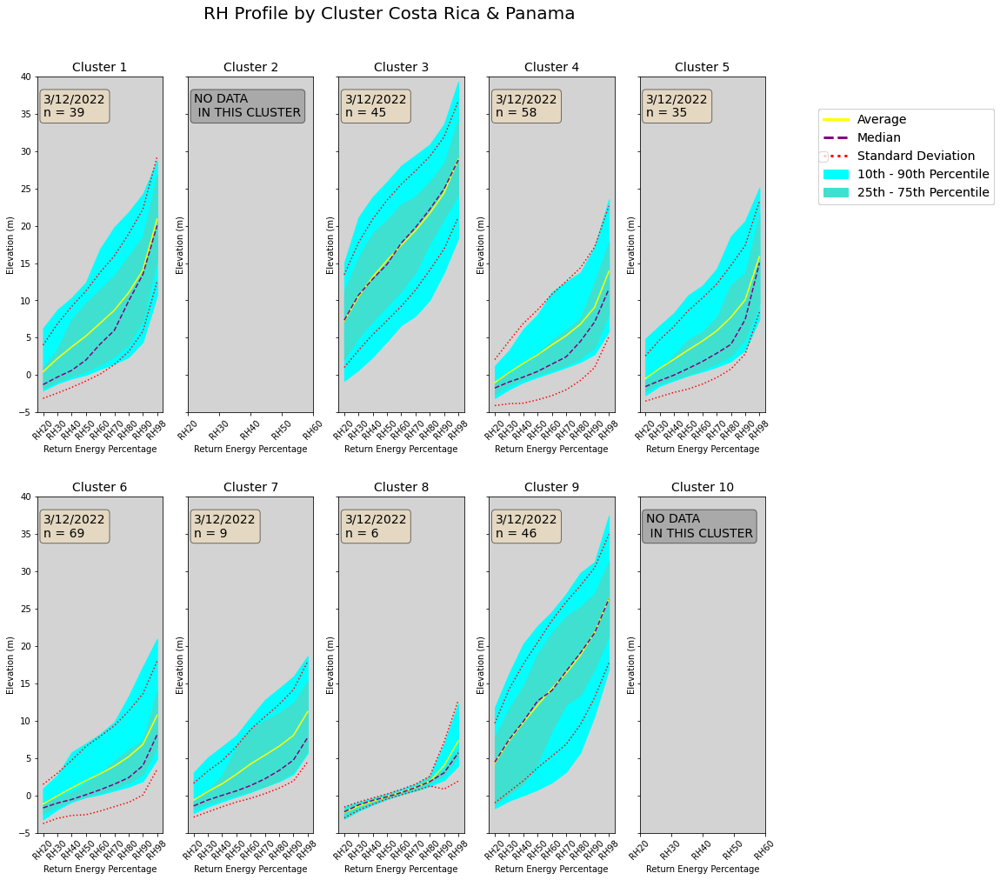

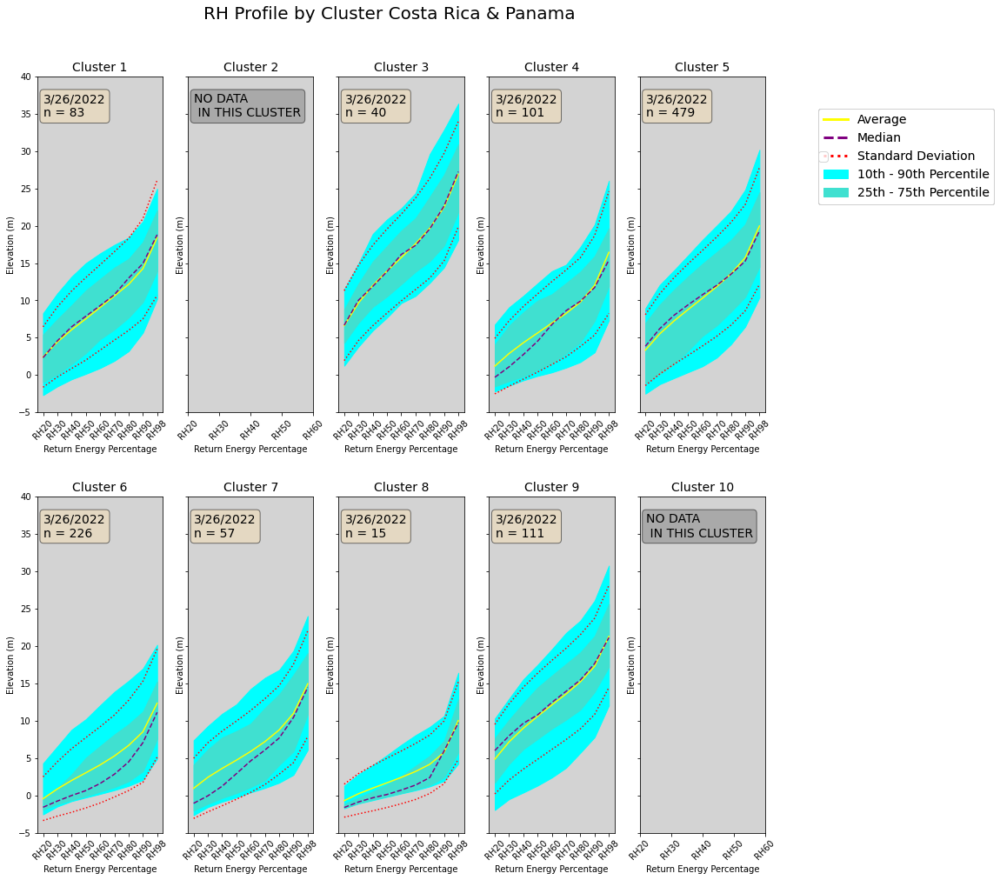

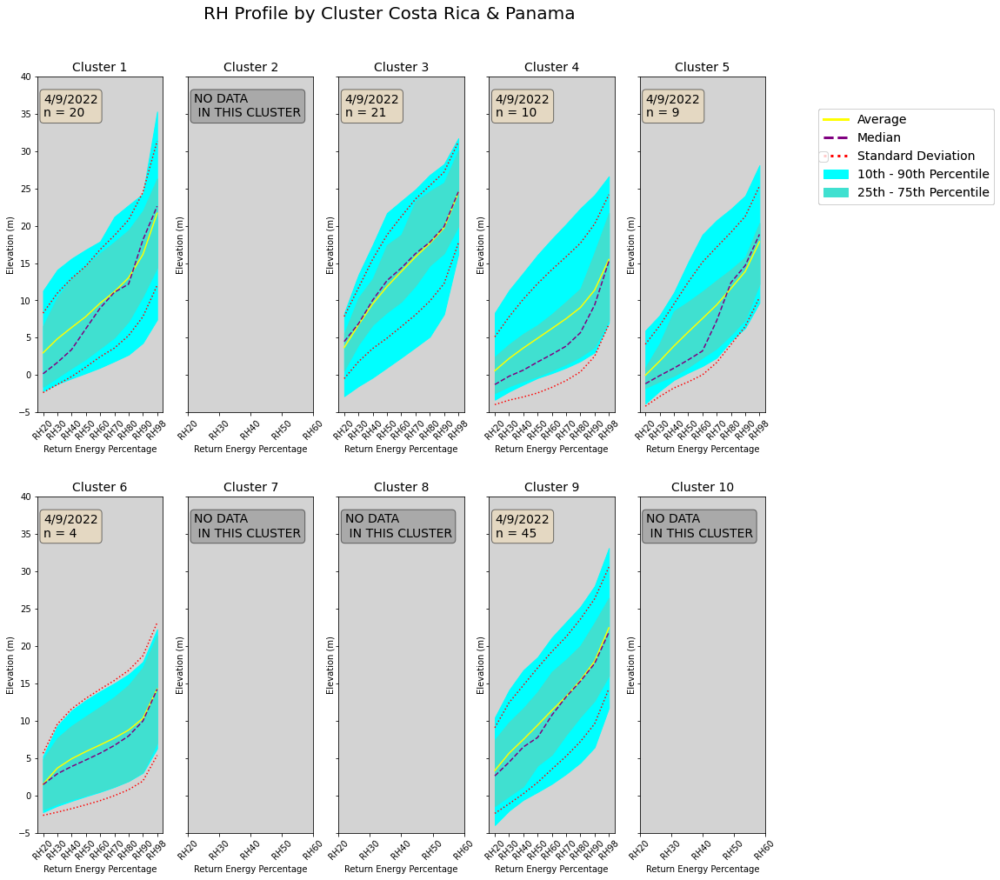

In [5]:
# below creates the static PNG files that will create the GIF
# loop through tickers and axes
time_groups = data.Group.unique()
clusters = [i for i in range(1, 11)]
xaxis = ['RH98', 'RH90', 'RH80', 'RH70', 'RH60', 'RH50', 'RH40', 'RH30', 'RH20']
xaxis.reverse()
for idx, time in enumerate(time_groups):
    DATE = str(pd.Timestamp(time).month) + '/' + str(pd.Timestamp(time).day) + '/' + str(pd.Timestamp(time).year)
    fig, axs = plt.subplots(nrows=2, ncols=5, sharey=True, figsize=(15, 16))
    plt.subplots_adjust(hspace=0.25)
    fig.suptitle("RH Profile by Cluster Costa Rica & Panama", fontsize=20, y=0.95)
    DATA = data[data.Group == time]
    for cluster, ax in zip(clusters, axs.ravel()):
        DF = DATA[DATA.Cluster == cluster]
        N = len(DF)
        if len(DF) <= 1:
            props = dict(boxstyle='round', facecolor='grey', alpha=0.5)
            # place a text box in upper left in axes coords
            ax.set_facecolor("lightgrey")
            ax.text(0.05, 0.95, 'NO DATA \n IN THIS CLUSTER', transform=ax.transAxes, fontsize=14,
            verticalalignment='top', bbox=props)
            ax.set_title('Cluster {cluster}'.format(cluster=cluster), fontsize=14)
            ax.set_xlabel('Return Energy Percentage')
            ax.set_xticklabels(xaxis, rotation = 45, fontsize=10)
            ax.set_ylabel('Elevation (m)')
            ax.set_ylim((-5, 40))
        elif len(DF) > 1:
            props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
            # place a text box in upper left in axes coords
            ax.set_facecolor("lightgrey")
            ax.text(0.05, 0.95, DATE + '\n' + 'n = {N}'.format(N=N), transform=ax.transAxes, fontsize=14,
            verticalalignment='top', bbox=props)
            rh_avgs = np.array(DF.mean(numeric_only = True)[xaxis])
            rh_stds = np.array(DF.std(numeric_only = True)[xaxis])
            rh_medians = np.array(DF.median(numeric_only = True)[xaxis])
            rh_q1 = np.array(DF.quantile(0.25)[xaxis])
            rh_q3 = np.array(DF.quantile(0.75)[xaxis])
            rh_p10 = np.array(DF.quantile(0.10)[xaxis])
            rh_p90 = np.array(DF.quantile(0.90)[xaxis])
            ax.fill_between(xaxis, rh_p10, rh_p90, color = 'cyan', label='10th - 90th Percentile')
            ax.fill_between(xaxis, rh_q1, rh_q3, color = 'turquoise', label='25th - 75th Percentile')
            # ax.set_facecolor("lightgrey")
            ax.set_title('Cluster {cluster}'.format(cluster=cluster), fontsize=14)
            ax.set_xlabel('Return Energy Percentage')
            ax.set_xticklabels(xaxis, rotation = 45, fontsize=10)
            ax.set_ylim((-5, 40))
            ax.set_ylabel('Elevation (m)')
            ax.plot(xaxis, np.array(rh_avgs), color='yellow', label = 'Average')
            ax.plot(xaxis, np.array(rh_medians), linestyle='dashed', color='purple', label = 'Median')
            ax.plot(xaxis, np.array(rh_avgs) - np.array(rh_stds), linestyle='dotted', color='red', label = 'Standard Deviation')
            ax.plot(xaxis, np.array(rh_avgs) + np.array(rh_stds), linestyle='dotted', color='red')
        handles, labels = ax.get_legend_handles_labels()
        leg = fig.legend(handles, labels, loc='center left', bbox_to_anchor=(0.95, 0.8), prop={'size': 14}, fontsize = 16)
        for line in leg.get_lines():
            line.set_linewidth(3.0)
                
    plt.savefig('/mnt/locutus/remotesensing/jbk/projects/climate/tropics/phenology_gedi/images/rh_profiles_for_GIF/Subplots_RH_Profile_by_cluster_time_{TIME}.png'.format(TIME=idx), 
    dpi=200, bbox_inches='tight', facecolor='white', edgecolor='black');
    # plt.show();

In [6]:
# Plot canopy height distribution by cluster

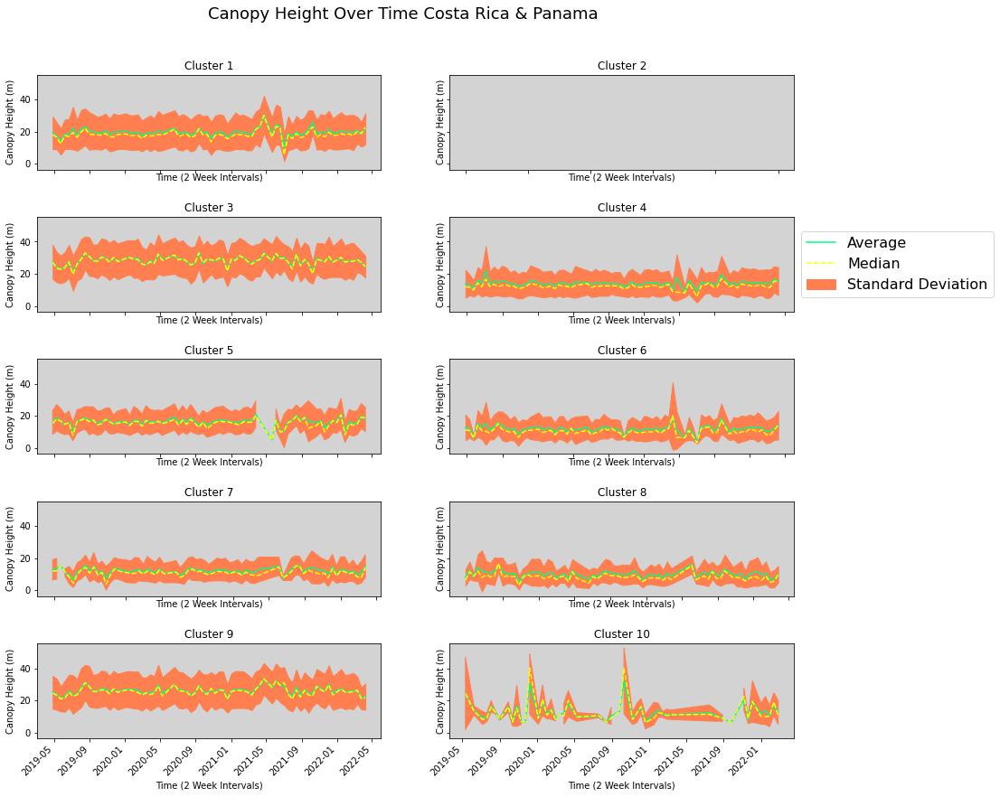

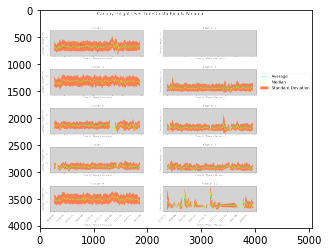

In [7]:
# define subplot grid
fig, axs = plt.subplots(nrows=5, ncols=2, sharey=True, figsize=(15, 15))
fig.autofmt_xdate(rotation=45)
plt.subplots_adjust(hspace=0.5)
fig.suptitle("Canopy Height Over Time Costa Rica & Panama", fontsize=18, y=0.95)

# loop through tickers and axes
clusters = [i for i in range(1, 11)]
for cluster, ax in zip(clusters, axs.ravel()):
    
    DF = data[data.Cluster == cluster]
    
    ht_avgs = np.array(DF[['RH98', 'Group']].groupby(['Group']).mean()['RH98'])
    ht_stds = np.array(DF[['RH98', 'Group']].groupby(['Group']).std()['RH98'])
    ht_med = np.array(DF[['RH98', 'Group']].groupby(['Group']).median()['RH98'])

    xaxis = np.sort(DF.Group.unique())
    ax.set_facecolor("lightgrey")
    ax.set_title('Cluster {cluster}'.format(cluster=cluster))
    ax.set_xlabel('Time (2 Week Intervals)')
    ax.set_ylabel('Canopy Height (m)')
    ax.fill_between(xaxis, np.array(ht_avgs) - np.array(ht_stds), np.array(ht_avgs) + np.array(ht_stds), color = 'coral', label='Standard Deviation')
    ax.plot(xaxis, np.array(ht_avgs), color='springgreen', label = 'Average')
    ax.plot(xaxis, np.array(ht_med), linestyle='dashed', color='yellow', label = 'Median')
    
    if cluster == 4:
        ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), prop={'size': 16}, fontsize = 16)
    
plt.savefig('/mnt/locutus/remotesensing/jbk/projects/climate/tropics/phenology_gedi/images/Subplots_CHT_Over_Time.png', dpi=330, bbox_inches='tight');
plt.show()


img = mpimg.imread('/mnt/locutus/remotesensing/jbk/projects/climate/tropics/phenology_gedi/images/Subplots_CHT_Over_Time.png')
plt.imshow(img)
plt.show()

In [41]:
# Read k=10 final centroids
k10_cent = pd.read_csv('/mnt/locutus/remotesensing/tropics/clustering/costa_rica_panama/k_10/seeds.out.costa_rica_panama_biweekly_smooth.2017-2020.10.final', delimiter="\t", header=None)

# create dates for the S2 time series 
dates=pd.date_range(start='2017-01-01', periods=25, freq='15D')
dates=dates.union(pd.date_range(start='2018-01-01', periods=25, freq='15D'))
dates=dates.union(pd.date_range(start='2019-01-01', periods=25, freq='15D'))
dates=dates.union(pd.date_range(start='2020-01-01', periods=25, freq='15D'))
phen_years=pd.DatetimeIndex(['2017-01-01', '2018-01-01', '2019-01-01', '2020-01-01', '2020-12-31'])

# NDRE
ndre_stats = pd.DataFrame()
# Read all univar files
for y in range(2017, 2020+1):
    for t in range(1,25+1):
        ustat = pd.read_csv('/mnt/locutus/remotesensing/tropics/clustering/costa_rica_panama/k_10/ndre_costa_rica_panama_k10_%d_%d.univar'%(y,t), sep=' ')
        ustat['date'] = dates[(y-2017)*25+t-1]
        ndre_stats = ndre_stats.append(ustat, ignore_index=True)
# make date the index variable
ndre_stats.set_index('date', inplace=True)

In [61]:
# below creates the static PNG files that will create the GIF
kdates=["01-01", "01-16", "01-31", "02-15", "03-02", "03-17", "04-01", "04-16", "05-01", "05-16", "05-31", "06-15", "06-30", "07-15", "07-30", "08-14", "08-29", "09-13", "09-28", "10-13", "10-28", "11-12", "11-27", "12-12", "12-27"]

# loop through tickers and axes
time_groups = data.Group.unique()
#clusters = [i for i in range(1, 11)]
clusters = [1]
xaxis = ['RH98', 'RH90', 'RH80', 'RH70', 'RH60', 'RH50', 'RH40', 'RH30', 'RH20']
xaxis.reverse()
for idx, time in enumerate(time_groups):
    DATE = str(pd.Timestamp(time).month) + '/' + str(pd.Timestamp(time).day) + '/' + str(pd.Timestamp(time).year)
    #fig, axs = plt.subplots(nrows=2, ncols=5, sharey=True, figsize=(15, 16)) 
    fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(15, 16), gridspec_kw={'height_ratios':[3,1]})
    plt.subplots_adjust(hspace=0.25)
    fig.suptitle("RH Profile by Cluster Costa Rica & Panama", fontsize=20, y=0.95)
    DATA = data[data.Group == time]
    for cluster, ax in zip(clusters, axs.ravel()):
        DF = DATA[DATA.Cluster == cluster]
        N = len(DF)
        if len(DF) <= 1:
            props = dict(boxstyle='round', facecolor='grey', alpha=0.5)
            # place a text box in upper left in axes coords
            ax.set_facecolor("lightgrey")
            ax.text(0.05, 0.95, 'NO DATA \n IN THIS CLUSTER', transform=ax.transAxes, fontsize=14,
            verticalalignment='top', bbox=props)
            ax.set_title('Cluster {cluster}'.format(cluster=cluster), fontsize=14)
            ax.set_xlabel('Return Energy Percentage')
            #ax.set_xticks(xaxis)
            ax.set_ylim((-5, 40))
            ax.set_xticklabels(xaxis, rotation = 45, fontsize=10)
            ax.set_ylabel('Elevation (m)')
            ax.set_ylim((-5, 40))
        elif len(DF) > 1:
            props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
            # place a text box in upper left in axes coords
            ax.set_facecolor("white")
            ax.text(0.05, 0.95, DATE + '\n' + 'n = {N}'.format(N=N), transform=ax.transAxes, fontsize=14,
            verticalalignment='top', bbox=props)
            rh_avgs = np.array(DF.mean(numeric_only = True)[xaxis])
            rh_stds = np.array(DF.std(numeric_only = True)[xaxis])
            rh_medians = np.array(DF.median(numeric_only = True)[xaxis])
            rh_q1 = np.array(DF.quantile(0.25)[xaxis])
            rh_q3 = np.array(DF.quantile(0.75)[xaxis])
            rh_p10 = np.array(DF.quantile(0.10)[xaxis])
            rh_p90 = np.array(DF.quantile(0.90)[xaxis])
            ax.fill_between(xaxis, rh_p10, rh_p90, color = 'cyan', label='10th - 90th Percentile')
            ax.fill_between(xaxis, rh_q1, rh_q3, color = 'turquoise', label='25th - 75th Percentile')
            # ax.set_facecolor("lightgrey")
            ax.set_title('Cluster {cluster}'.format(cluster=cluster), fontsize=14)
            ax.set_xlabel('Return Energy Percentage')
            ax.set_xticks(xaxis)
            ax.set_xticklabels(xaxis, rotation = 45, fontsize=10)
            ax.set_ylim([-5, 40])
            ax.set_ylabel('Elevation (m)')
            ax.plot(xaxis, np.array(rh_avgs), color='yellow', label = 'Average')
            ax.plot(xaxis, np.array(rh_medians), linestyle='dashed', color='purple', label = 'Median')
            ax.plot(xaxis, np.array(rh_avgs) - np.array(rh_stds), linestyle='dotted', color='red', label = 'Standard Deviation')
            ax.plot(xaxis, np.array(rh_avgs) + np.array(rh_stds), linestyle='dotted', color='red')
            
            
        #axs[1].plot(kdates, k10_cent.iloc[0,:])    
        #axs[1].set_ylim([0,1])
            # NDRE
        k=cluster-1
        axs[1].fill_between(ndre_stats[ndre_stats['zone']==(k+1)].index, ndre_stats[ndre_stats['zone']==(k+1)]['perc_10'], ndre_stats[ndre_stats['zone']==(k+1)]['perc_90'], alpha=0.10)
        axs[1].fill_between(ndre_stats[ndre_stats['zone']==(k+1)].index, ndre_stats[ndre_stats['zone']==(k+1)]['first_quart'], ndre_stats[ndre_stats['zone']==(k+1)]['third_quart'], alpha=0.25)
        axs[1].plot(ndre_stats[ndre_stats['zone']==(k+1)].index, ndre_stats[ndre_stats['zone']==(k+1)]['median'])
        axs[1].axvspan(phen_years[0], phen_years[1], alpha=0.10, color='red')
        axs[1].axvspan(phen_years[1], phen_years[2], alpha=0.10, color='blue')
        axs[1].axvspan(phen_years[2], phen_years[3], alpha=0.10, color='green')
        axs[1].axvspan(phen_years[3], phen_years[4], alpha=0.10, color='yellow')
        axs[1].set_title("NDRE [Cluster: %d]"%(k+1))
        axs[1].set_xlabel("Time")
        axs[1].set_ylabel("NDRE")
        axs[1].set_ylim([0,1])
        axs[1].axvline(pd.Timestamp(time), color='black')
            
        handles, labels = ax.get_legend_handles_labels()
        leg = fig.legend(handles, labels, loc='center left', bbox_to_anchor=(0.95, 0.8), prop={'size': 14}, fontsize = 16)
        for line in leg.get_lines():
            line.set_linewidth(3.0)
                
    plt.savefig('/mnt/locutus/remotesensing/jbk/projects/climate/tropics/phenology_gedi/images/k_10_%d/Subplots_RH_Profile_by_cluster_time_%02d.png'%(k+1, idx), 
    dpi=200, bbox_inches='tight', facecolor='white', edgecolor='black');
    plt.close(fig)
    # plt.show();

In [24]:
k10_cent.iloc[0,:]

0     0.479525
1     0.478014
2     0.477250
3     0.477474
4     0.478225
5     0.480736
6     0.482723
7     0.485473
8     0.489301
9     0.492309
10    0.494214
11    0.495504
12    0.497817
13    0.500878
14    0.502273
15    0.504558
16    0.506314
17    0.505556
18    0.504767
19    0.502804
20    0.500559
21    0.496303
22    0.490628
23    0.485067
24    0.479517
Name: 0, dtype: float64

(0.0, 0.5)

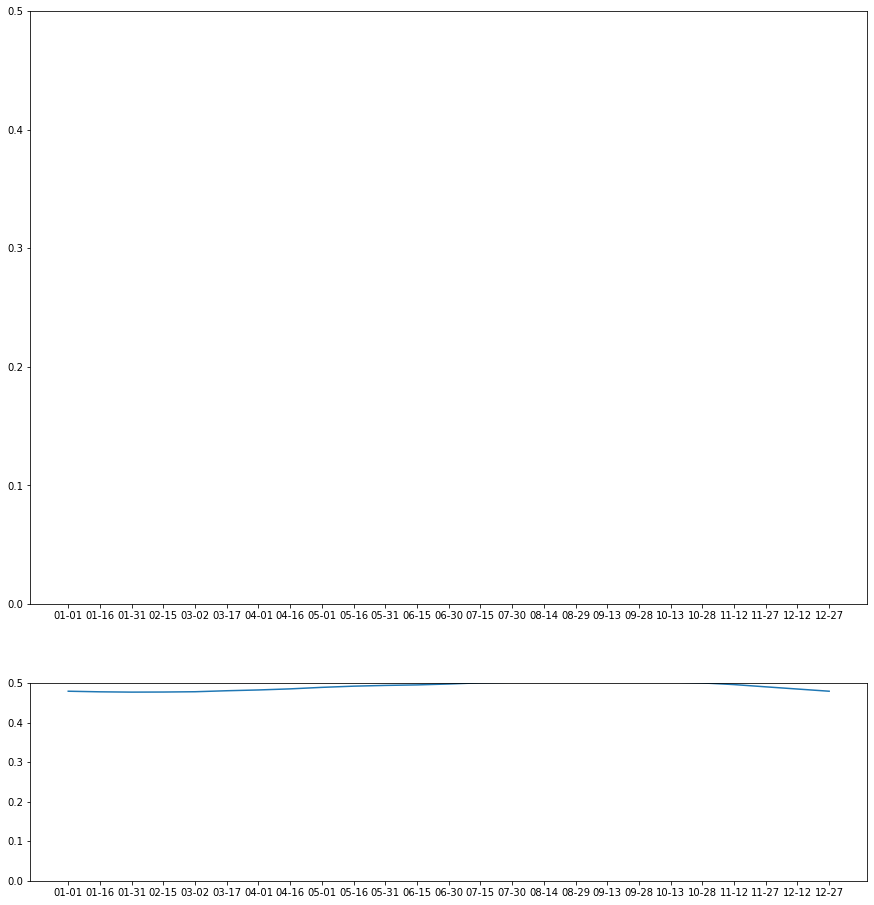

In [39]:
fig, axs = plt.subplots(nrows=2, ncols=1, sharey=True, figsize=(15, 16), gridspec_kw={'height_ratios':[3,1]})
axs[1].plot(kdates, k10_cent.iloc[0,:])
axs[0].plot(kdates, k10_cent.iloc[1,:])
axs[0].set_ylim([0,0.5])

In [37]:
k10_cent.iloc[1,:]

0    -0.124338
1    -0.117089
2    -0.110579
3    -0.106091
4    -0.104420
5    -0.103125
6    -0.103015
7    -0.103874
8    -0.105568
9    -0.108254
10   -0.110793
11   -0.112784
12   -0.116459
13   -0.121025
14   -0.126294
15   -0.131512
16   -0.138098
17   -0.142333
18   -0.145687
19   -0.146929
20   -0.148053
21   -0.148504
22   -0.145593
23   -0.139864
24   -0.133345
Name: 1, dtype: float64